In [102]:
# k-means
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
# k nearest neighburs 
from sklearn.neighbors import NearestNeighbors
# scaler
from sklearn.preprocessing import StandardScaler
# silhouette scores
from sklearn.metrics import silhouette_score, silhouette_samples
! pip install folium
import folium
import nltk

Defaulting to user installation because normal site-packages is not writeable


In [21]:
data = pd.read_table("./data/clustered-data-title.csv", sep=",")

In [22]:
from datetime import datetime

# Define a function to calculate the difference in days
def calculate_days_difference(row):
    date1 = datetime(2000, 1, 1)  # Use a dummy year
    date2 = datetime(2000, row['date_taken_month'], row['date_taken_day'])
    return abs((date2 - date1).days)

# Apply the function to each row in the dataframe
data['days_difference'] = data.apply(lambda row: calculate_days_difference(row), axis=1)

data

,id,user,lat,long,tags,title,date_taken_minute,date_taken_hour,date_taken_day,date_taken_month,...,date_upload_hour,date_upload_day,date_upload_month,date_upload_year,Unnamed: 16,Unnamed: 17,Unnamed: 18,k-means labels,common_words,days_difference
0,4395181099,30624617@N03,45.754858,4.821710,"chair,lyon,rhône,chaise,rhônealpes",Chaises avec vue,11.0,15,28,2,...,20,28.0,2,2010.0,NaN,NaN,NaN,39,"[('Saône', 44)]",58
1,4394748717,35853470@N00,45.753270,4.862953,NaN,NaN,51.0,17,28,2,...,17,28.0,2,2010.0,NaN,NaN,NaN,117,"[('DoctorWhoClassic', 109)]",58
2,4394694699,11817998@N05,45.760655,4.846564,"365,iphone",59/365 - R46 V103 B163,29.0,17,28,2,...,17,28.0,2,2010.0,NaN,NaN,NaN,3,"[('Incity', 170)]",58
3,4394803790,11545749@N06,45.784000,4.874072,"nin,nineinchnails,gift,screening,toiou,avott",2010-01-29 Toiou Avott Lyon,15.0,20,28,1,...,12,28.0,2,2010.0,NaN,NaN,NaN,87,"[('Karna', 79)]",27
4,4394803554,11545749@N06,45.784000,4.874072,"lyon,nin,nineinchnails,gift,screening,toiou,avott",2010-01-28 Toiou Avott Lyon,10.0,20,28,1,...,12,28.0,2,2010.0,NaN,NaN,NaN,87,"[('Karna', 79)]",27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184051,44402328654,90493526@N00,45.758316,4.825197,"europe,france,lyon,croixrousse,streetart,wheat...","Pasted paper by Big Ben [Lyon, France]",18.0,17,30,9,...,23,5.0,10,2018.0,NaN,NaN,NaN,109,"[('Georges', 130)]",273
184052,44210748275,144146684@N04,45.762635,4.837299,NaN,white blood,36.0,16,5,10,...,22,5.0,10,2018.0,NaN,NaN,NaN,121,"[('Fête', 187)]",278
184053,45122361361,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Porte Passage de l'Argue,48.0,19,27,9,...,22,5.0,10,2018.0,NaN,NaN,NaN,121,"[('Fête', 187)]",270
184054,45073351222,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Passage de l'Argue,48.0,19,27,9,...,22,5.0,10,2018.0,NaN,NaN,NaN,121,"[('Fête', 187)]",270


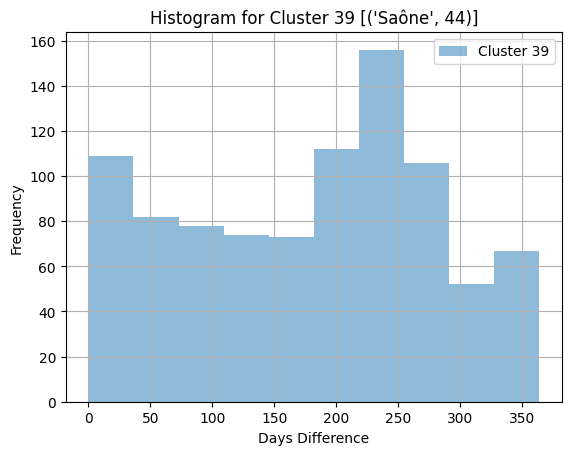

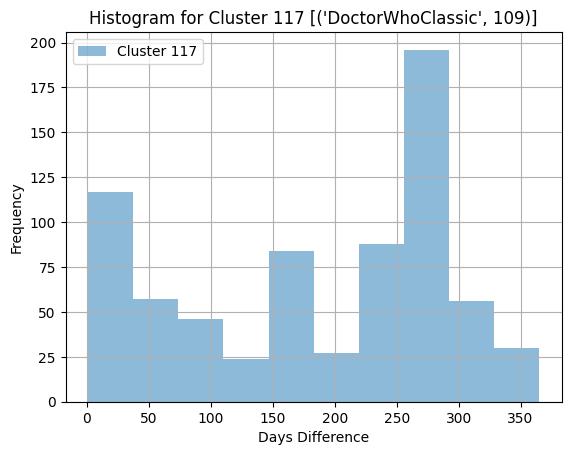

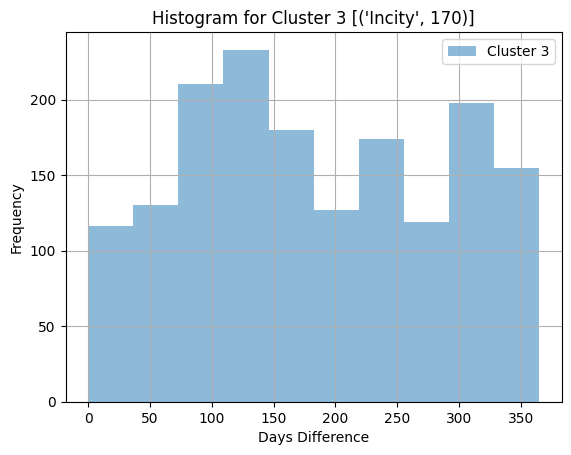

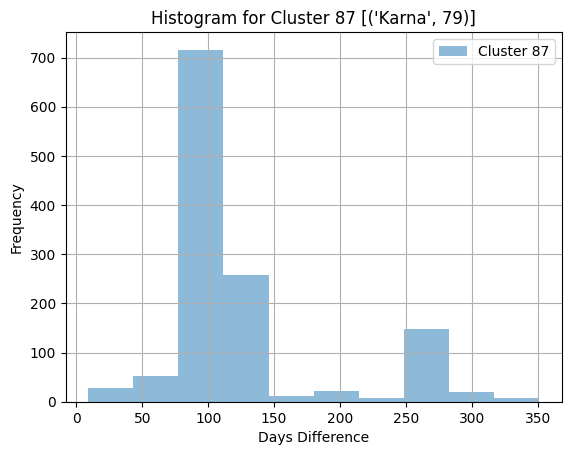

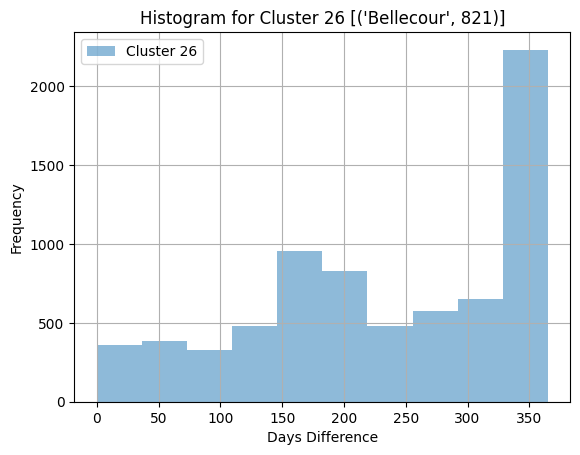

...

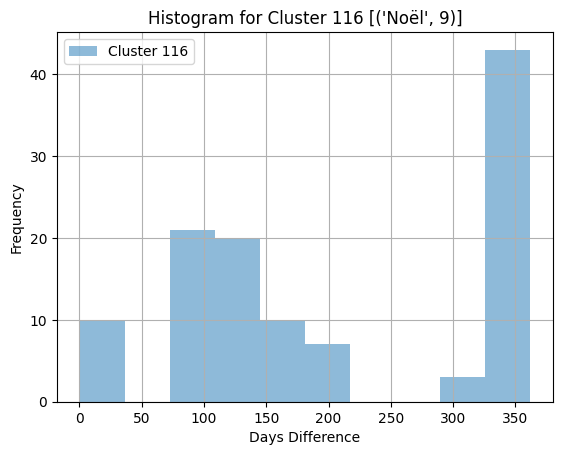

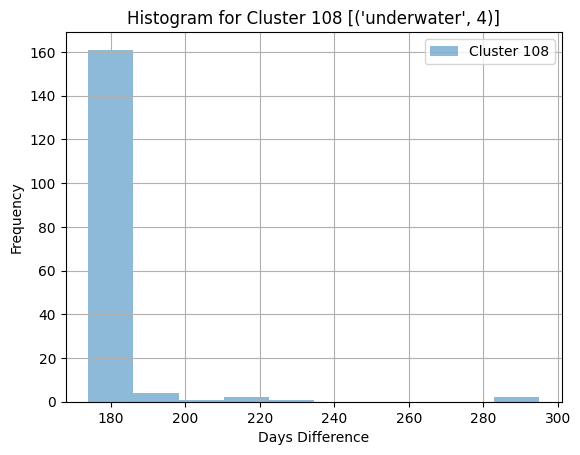

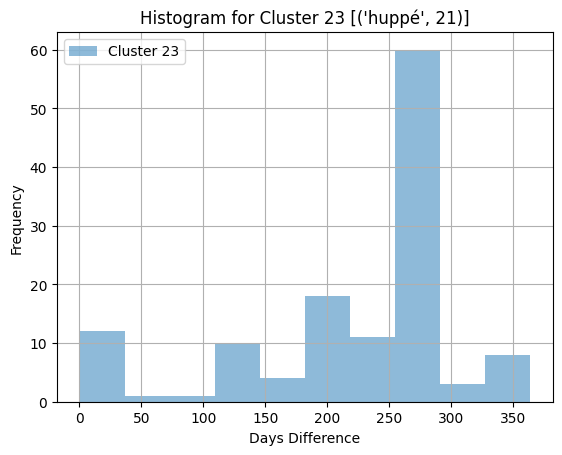

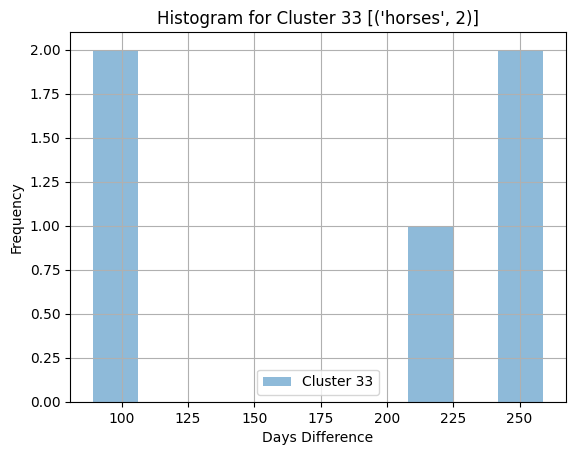

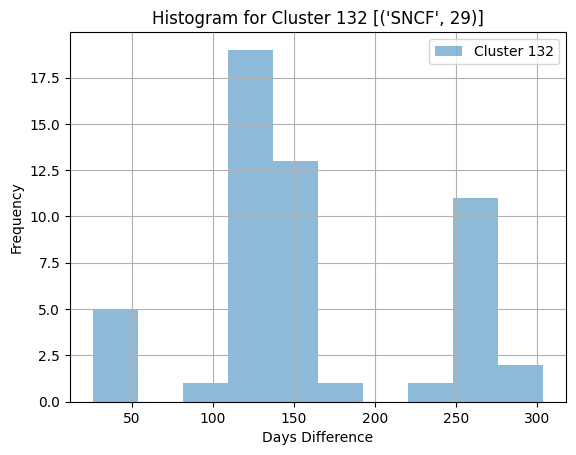

In [30]:
for cluster in data['k-means labels'].unique():
    cluster_data = data[data['k-means labels'] == cluster]
    cluster_title = cluster_data.iloc[0]['common_words']
    plt.figure()
    cluster_data['days_difference'].hist(alpha=0.5, label=f'Cluster {cluster}')
    plt.legend()
    plt.title(f'Histogram for Cluster {cluster} {cluster_title}')
    plt.xlabel('Days Difference')
    plt.ylabel('Frequency')
    plt.show()

In [31]:
data['sin_days_difference'] = np.sin(2 * np.pi * data['days_difference'] / 365)
data.head()

,id,user,lat,long,tags,title,date_taken_minute,date_taken_hour,date_taken_day,date_taken_month,...,date_upload_day,date_upload_month,date_upload_year,Unnamed: 16,Unnamed: 17,Unnamed: 18,k-means labels,common_words,days_difference,sin_days_difference
0,4395181099,30624617@N03,45.754858,4.821710,"chair,lyon,rhône,chaise,rhônealpes",Chaises avec vue,11.0,15,28,2,...,28.0,2,2010.0,NaN,NaN,NaN,39,"[('Saône', 44)]",58,0.840618
1,4394748717,35853470@N00,45.753270,4.862953,NaN,NaN,51.0,17,28,2,...,28.0,2,2010.0,NaN,NaN,NaN,117,"[('DoctorWhoClassic', 109)]",58,0.840618
2,4394694699,11817998@N05,45.760655,4.846564,"365,iphone",59/365 - R46 V103 B163,29.0,17,28,2,...,28.0,2,2010.0,NaN,NaN,NaN,3,"[('Incity', 170)]",58,0.840618
3,4394803790,11545749@N06,45.784000,4.874072,"nin,nineinchnails,gift,screening,toiou,avott",2010-01-29 Toiou Avott Lyon,15.0,20,28,1,...,28.0,2,2010.0,NaN,NaN,NaN,87,"[('Karna', 79)]",27,0.448229
4,4394803554,11545749@N06,45.784000,4.874072,"lyon,nin,nineinchnails,gift,screening,toiou,avott",2010-01-28 Toiou Avott Lyon,10.0,20,28,1,...,28.0,2,2010.0,NaN,NaN,NaN,87,"[('Karna', 79)]",27,0.448229


In [51]:
# Scale the data
columns_to_drop = ['id', 'user', 'tags', 'title',  'date_taken_minute', 'date_taken_hour', 'date_taken_day', 'date_taken_month', 'date_taken_year', 'date_upload_minute', 'date_upload_hour', 'date_upload_day', 'date_upload_month', 'date_upload_year', 'Unnamed: 16', 'Unnamed: 17',	'Unnamed: 18', 'common_words', 'days_difference', 'k-means labels']
df_clustering = data.drop(columns_to_drop , axis=1)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_clustering)
# show
print(scaled_data)
# create a DataFrame
scaled_data_df = pd.DataFrame(data=scaled_data, columns=df_clustering.columns)
scaled_data_df.head()

[[-0.46995661 -0.55310648  1.2624814 ]
 [-0.52557343  0.72670216  1.2624814 ]
 [-0.26692721  0.21813625  1.2624814 ]
 ...
 [-0.1617876  -0.10930212 -1.37938324]
 [-0.1617876  -0.10930212 -1.37938324]
 [-0.35357457 -0.23482223 -1.38076638]]


,lat,long,sin_days_difference
0,-0.469957,-0.553106,1.262481
1,-0.525573,0.726702,1.262481
2,-0.266927,0.218136,1.262481
3,0.550689,1.071735,0.698642
4,0.550689,1.071735,0.698642


In [113]:
# number of clusters 
k = 155 #250
# create a model
kmeans = KMeans(n_clusters=k, init='k-means++')
# fit scaled data
kmeans.fit(scaled_data_df)

KMeans(n_clusters=155)

In [114]:
# associated cluster labels
labels = kmeans.labels_
print(f"k-means labels: {labels}")

k-means labels: [127  91  33 ...   4   4 134]


In [116]:
# sum of squared distances
inertia = kmeans.inertia_
print(f"Sum of squared distances: {inertia}")

Sum of squared distances: 8581.281808310141


In [117]:
# Group by 'k-means labels' and calculate the statistics
data['time k-means labels'] = labels
cluster_stats = data.groupby('time k-means labels')['sin_days_difference'].agg(['min', 'max', 'mean', 'median'])

# Display the statistics
print(cluster_stats)

                          min       max      mean    median
time k-means labels                                        
0                   -0.552435 -0.255353 -0.394825 -0.393590
1                   -0.247022  0.501242  0.271873  0.417194
2                    0.094537  0.432776  0.248056  0.263665
3                    0.780296  0.999991  0.933014  0.958718
4                   -0.999991 -0.863142 -0.960826 -0.972118
...                       ...       ...       ...       ...
150                 -0.493776  0.068802 -0.226197 -0.296713
151                  0.043022  0.628763  0.306522  0.329408
152                 -0.999991 -0.580800 -0.889220 -0.903356
153                 -0.999991 -0.587785 -0.920723 -0.961130
154                 -0.999917 -0.523416 -0.868756 -0.907014

[155 rows x 4 columns]


In [118]:
unique_time_clusters = data.groupby('k-means labels')['time k-means labels'].unique()
print(unique_time_clusters)
print(unique_time_clusters[79])

k-means labels
0      [3, 45, 96, 68, 36, 55, 62, 9, 65, 78, 0, 47, ...
1                                        [16, 86, 5, 46]
2                            [22, 90, 2, 113, 29, 99, 7]
3      [33, 121, 32, 111, 30, 107, 12, 139, 78, 148, ...
6                                 [131, 28, 41, 23, 110]
                             ...                        
145       [56, 72, 22, 7, 90, 113, 136, 29, 95, 125, 99]
146                  [130, 58, 152, 91, 73, 17, 10, 151]
147                        [52, 58, 94, 83, 17, 61, 130]
148                            [135, 52, 119, 8, 20, 83]
149                         [122, 153, 147, 85, 51, 124]
Name: time k-means labels, Length: 147, dtype: object
[113  90  22  99   7  29  89]


In [119]:
unique_time_clusters = data.groupby('time k-means labels')['common_words'].unique()
unique_time_clusters

time k-means labels
0      [[('Jean', 704)], [('Georges', 130)], [('Saône...
1      [[('Décines', 10)], [('20100325tassaux_jlc', 1...
2      [[('Chaos', 8268)], [('Bocuse', 85)], [('terre...
3      [[('Vieux', 324)], [('Georges', 130)], [('Bell...
4      [[('Fête', 187)], [('SaintNizier', 121)], [('p...
                             ...                        
150    [[('Rallye', 21)], [('Lione', 26)], [('Rillieu...
151    [[('DoctorWhoClassic', 109)], [('PartDieu', 15...
152    [[('Lumière', 198)], [('Lacassagne', 13)], [('...
153    [[('TOP14', 357)], [('s', 59)], [('Petit', 25)...
154    [[('championnats', 136)], [('Fonderie', 112)],...
Name: common_words, Length: 155, dtype: object

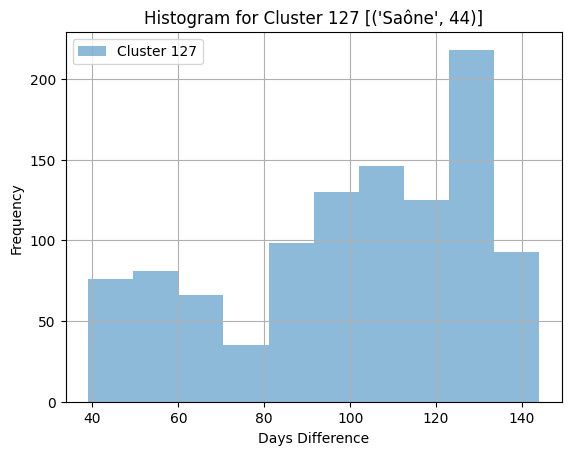

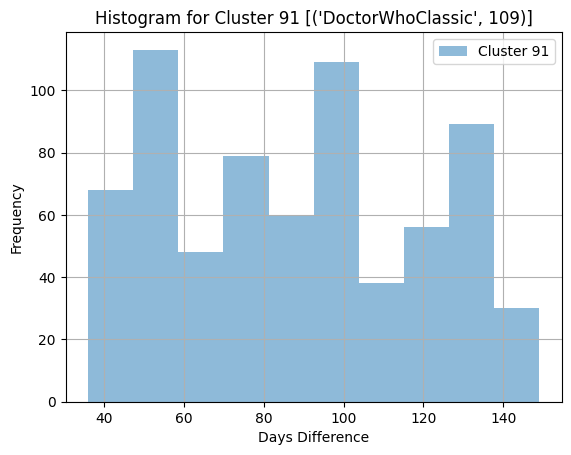

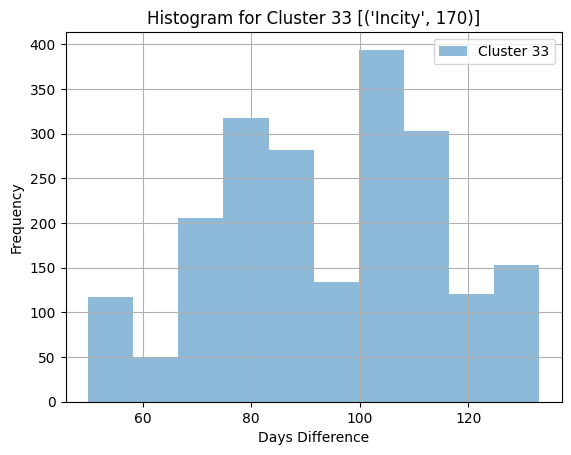

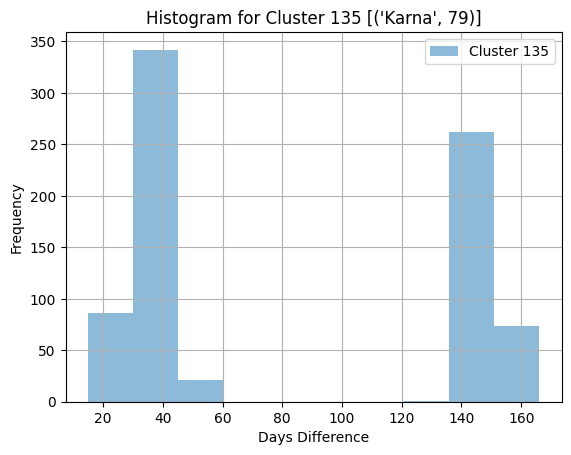

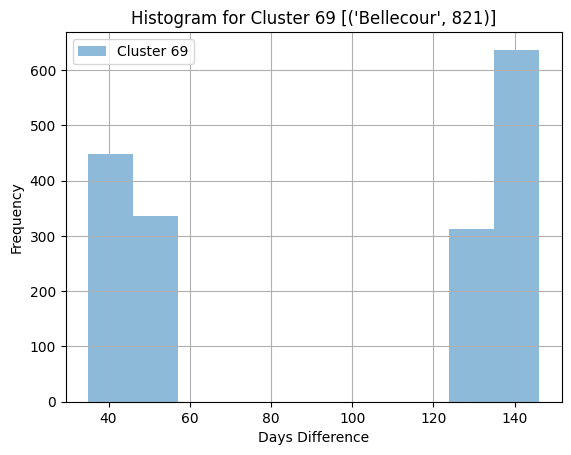

...

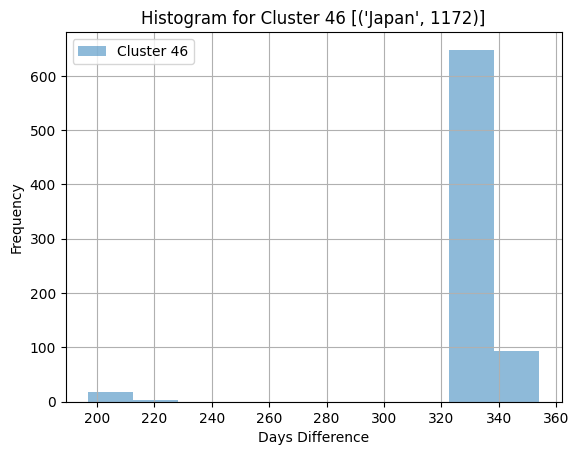

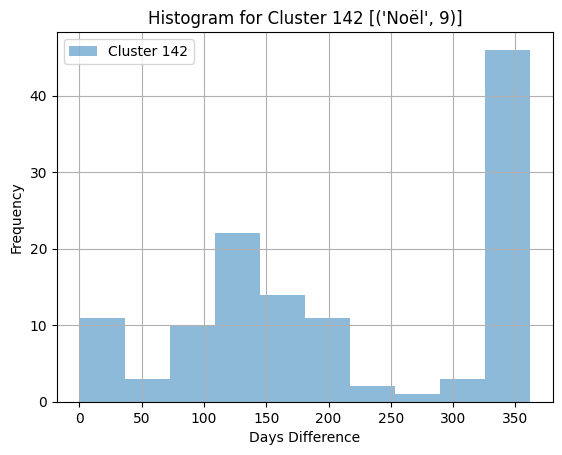

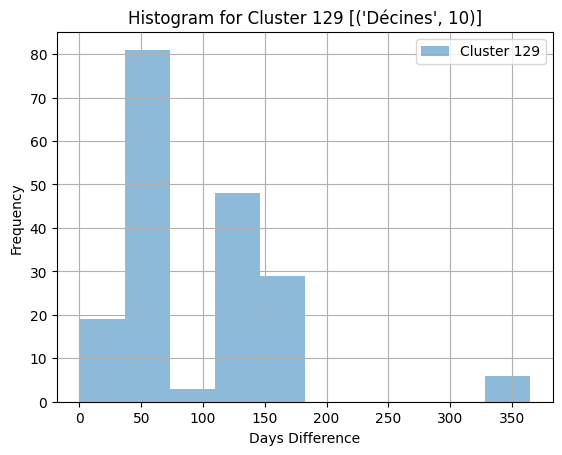

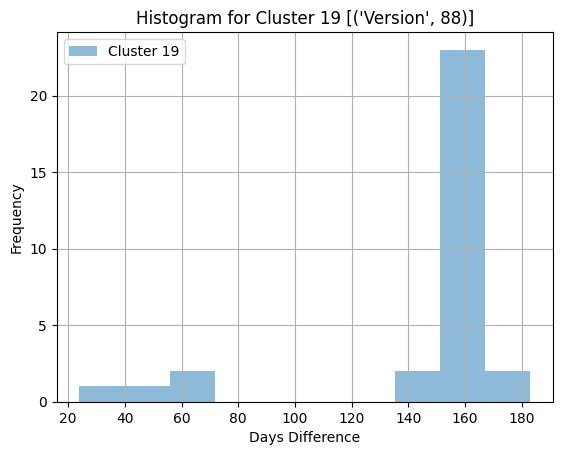

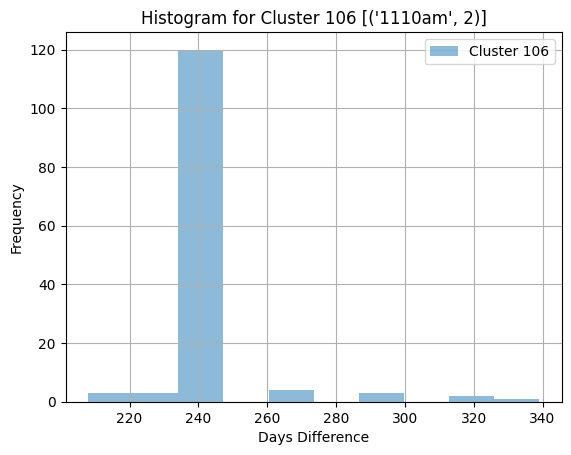

In [120]:
for cluster in data['time k-means labels'].unique():
    cluster_data = data[data['time k-means labels'] == cluster]
    cluster_title = cluster_data.iloc[0]['common_words']
    plt.figure()
    cluster_data['days_difference'].hist(alpha=0.5, label=f'Cluster {cluster}')
    plt.legend()
    plt.title(f'Histogram for Cluster {cluster} {cluster_title}')
    plt.xlabel('Days Difference')
    plt.ylabel('Frequency')
    plt.show()

In [121]:

# Randomly sample 1500 objects from filtered_data_dsbcan
sampled_data = data.sample(n=1000)

# Create a folium map centered around the mean latitude and longitude of the sampled data
map_sampled_clusters = folium.Map(location=[sampled_data['lat'].mean(), sampled_data['long'].mean()], zoom_start=12, control_scale=True)

# Add markers for each sampled data point
# Define a color palette
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

# Add markers for each sampled data point with different colors for different clusters
for _, row in sampled_data[sampled_data['time k-means labels'] != -1].iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f'Cluster {row["time k-means labels"]}',
        icon=folium.Icon(color=colors[row["time k-means labels"] % len(colors)], icon='info-sign')
    ).add_to(map_sampled_clusters)

map_sampled_clusters

# Word analysis

In [122]:
from collections import Counter
import re

dataset_cluster = {}

dataset = data[~data['title'].isna()][['title', 'time k-means labels']]

for cluster in dataset['time k-means labels'].unique():
    dataset_cluster[cluster] = dataset[dataset['time k-means labels'] == cluster]

    dataset_cluster_tokens = [nltk.word_tokenize(title, 'french') for title in dataset_cluster[cluster]['title']]

    # Remove stop words in french
    stop_words = set(nltk.corpus.stopwords.words('french'))
    dataset_cluster_tokens = [[token for token in tokens if token.lower() not in stop_words] for tokens in dataset_cluster_tokens]

    # Remove stopwords in english
    stop_words = set(nltk.corpus.stopwords.words('english'))
    dataset_cluster_tokens = [[token for token in tokens if token.lower() not in stop_words] for tokens in dataset_cluster_tokens]

    # Remove symbols like '#' and '()'
    dataset_cluster_tokens = [[re.sub(r'[^\w\s]', '', token) for token in tokens] for tokens in dataset_cluster_tokens]

    # Remove empty tokens
    dataset_cluster_tokens = [[token for token in tokens if token] for tokens in dataset_cluster_tokens]

    # Remove the word 'lyon' and 'france'
    dataset_cluster_tokens = [[token for token in tokens if token.lower() not in ['lyon', 'france']] for tokens in dataset_cluster_tokens]

    # Remove numbers
    dataset_cluster_tokens = [[token for token in tokens if not token.isnumeric()] for tokens in dataset_cluster_tokens]

    # Flatten the list of tokenized titles
    all_tokens = [token for sublist in dataset_cluster_tokens for token in sublist]

    # Count the frequency of each word
    word_freq = Counter(all_tokens)

    # write the most common words in a dictionary
    dataset_cluster[cluster] = word_freq.most_common(1)

dataset_cluster


{np.int32(127): [('Ok', 58)],
 np.int32(33): [('Nuit', 254)],
 np.int32(135): [('Tattoos', 128)],
 np.int32(3): [('Jean', 161)],
 np.int32(115): [('Fourvière', 381)],
 np.int32(137): [('paper', 321)],
 np.int32(22): [('Chaos', 2637)],
 np.int32(100): [('Place', 163)],
 np.int32(38): [('Place', 84)],
 np.int32(17): [('Sharpei', 32)],
 np.int32(88): [('Colloque', 37)],
 np.int32(69): [('Open', 126)],
 np.int32(45): [('Fourvière', 275)],
 np.int32(91): [('Lumière', 45)],
 np.int32(96): [('saxotaz', 232)],
 np.int32(25): [('Parc', 144)],
 np.int32(9): [('Vieux', 274)],
 np.int32(49): [('Championnat', 189)],
 np.int32(58): [('Urba', 46)],
 np.int32(87): [('Parc', 104)],
 np.int32(116): [('Place', 218)],
 np.int32(56): [('Musée', 123)],
 np.int32(36): [('Basilique', 285)],
 np.int32(90): [('Chaos', 1604)],
 np.int32(130): [('EtatsUnis', 43)],
 np.int32(68): [('Fourvière', 328)],
 np.int32(109): [('Rhône', 248)],
 np.int32(121): [('Tour', 84)],
 np.int32(114): [('Parc', 138)],
 np.int32(18): 

In [123]:
# Create a new column in the data DataFrame to store the most common words for each cluster
data['time common_words'] = data['time k-means labels'].map(lambda x: dataset_cluster.get(x, []))

# Display the updated DataFrame
display(data)

# Save the updated DataFrame to a new CSV file
data.to_csv("data/clustered-data-time-title.csv", index=False)

,id,user,lat,long,tags,title,date_taken_minute,date_taken_hour,date_taken_day,date_taken_month,...,date_upload_year,Unnamed: 16,Unnamed: 17,Unnamed: 18,k-means labels,common_words,days_difference,sin_days_difference,time k-means labels,time common_words
0,4395181099,30624617@N03,45.754858,4.821710,"chair,lyon,rhône,chaise,rhônealpes",Chaises avec vue,11.0,15,28,2,...,2010.0,NaN,NaN,NaN,39,"[('Saône', 44)]",58,0.840618,127,"[(Ok, 58)]"
1,4394748717,35853470@N00,45.753270,4.862953,NaN,NaN,51.0,17,28,2,...,2010.0,NaN,NaN,NaN,117,"[('DoctorWhoClassic', 109)]",58,0.840618,91,"[(Lumière, 45)]"
2,4394694699,11817998@N05,45.760655,4.846564,"365,iphone",59/365 - R46 V103 B163,29.0,17,28,2,...,2010.0,NaN,NaN,NaN,3,"[('Incity', 170)]",58,0.840618,33,"[(Nuit, 254)]"
3,4394803790,11545749@N06,45.784000,4.874072,"nin,nineinchnails,gift,screening,toiou,avott",2010-01-29 Toiou Avott Lyon,15.0,20,28,1,...,2010.0,NaN,NaN,NaN,87,"[('Karna', 79)]",27,0.448229,135,"[(Tattoos, 128)]"
4,4394803554,11545749@N06,45.784000,4.874072,"lyon,nin,nineinchnails,gift,screening,toiou,avott",2010-01-28 Toiou Avott Lyon,10.0,20,28,1,...,2010.0,NaN,NaN,NaN,87,"[('Karna', 79)]",27,0.448229,135,"[(Tattoos, 128)]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184051,44402328654,90493526@N00,45.758316,4.825197,"europe,france,lyon,croixrousse,streetart,wheat...","Pasted paper by Big Ben [Lyon, France]",18.0,17,30,9,...,2018.0,NaN,NaN,NaN,109,"[('Georges', 130)]",273,-0.999917,68,"[(Fourvière, 328)]"
184052,44210748275,144146684@N04,45.762635,4.837299,NaN,white blood,36.0,16,5,10,...,2018.0,NaN,NaN,NaN,121,"[('Fête', 187)]",278,-0.997325,134,"[(Place, 115)]"
184053,45122361361,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Porte Passage de l'Argue,48.0,19,27,9,...,2018.0,NaN,NaN,NaN,121,"[('Fête', 187)]",270,-0.997917,4,"[(paper, 231)]"
184054,45073351222,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Passage de l'Argue,48.0,19,27,9,...,2018.0,NaN,NaN,NaN,121,"[('Fête', 187)]",270,-0.997917,4,"[(paper, 231)]"


In [125]:
# Randomly sample 1500 objects from filtered_data_dsbcan
sampled_data = data.sample(n=1000)

# Create a folium map centered around the mean latitude and longitude of the sampled data
map_sampled_clusters = folium.Map(location=[sampled_data['lat'].mean(), sampled_data['long'].mean()], zoom_start=12, control_scale=True)

# Add markers for each sampled data point
# Define a color palette
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

# Add markers for each sampled data point with different colors for different clusters
for _, row in sampled_data[sampled_data['time k-means labels'] != -1].iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f'Cluster {row["time k-means labels"]}: {row['time common_words']}',
        icon=folium.Icon(color=colors[row["time k-means labels"] % len(colors)], icon='info-sign')
    ).add_to(map_sampled_clusters)

map_sampled_clusters